### CS419 - Assignment 3

---

Filiz İpek Oktay - 30780

In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
%matplotlib inline
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import pandas as pd

**Question 1**: Morpological Hole Filling

In [3]:
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1zJFg3dh85FP9kURTCeRrQCT80VGMeGQx" -O q1.png

--2024-11-26 13:17:58--  https://drive.google.com/uc?export=download&id=1zJFg3dh85FP9kURTCeRrQCT80VGMeGQx
Resolving drive.google.com (drive.google.com)... 74.125.139.102, 74.125.139.138, 74.125.139.139, ...
Connecting to drive.google.com (drive.google.com)|74.125.139.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1zJFg3dh85FP9kURTCeRrQCT80VGMeGQx&export=download [following]
--2024-11-26 13:17:58--  https://drive.usercontent.google.com/download?id=1zJFg3dh85FP9kURTCeRrQCT80VGMeGQx&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 173.194.212.132, 2607:f8b0:400c:c11::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|173.194.212.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19347 (19K) [image/png]
Saving to: ‘q1.png’

q1.png              100%[===================>]  18.89K  --.-KB/s    in 0s      

2024-11

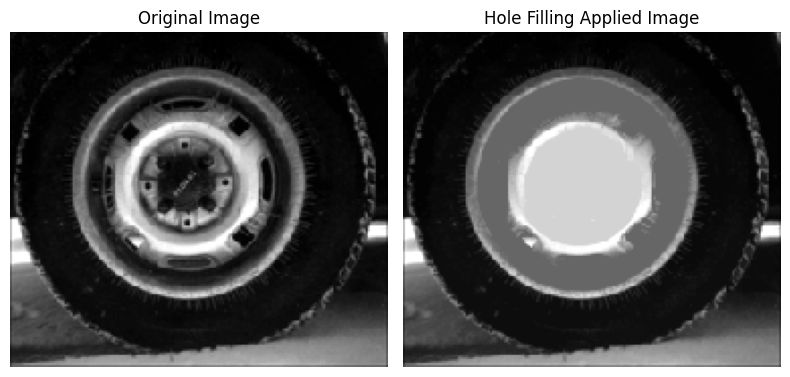

In [4]:
def fill_holes_with_reconstruction(image):
    #Creating the marker image
    marker_image = create_marker_image(image)

    #Performing morphological reconstruction
    filled_image = morphological_reconstruction(image, marker_image)

    return filled_image

def create_marker_image(image):
    # Initializing the marker image with the maximum value (255 for an 8-bit image)
    marker_image = np.full_like(image, 255)

    # Setting border pixels to the original image values
    marker_image[0, :] = image[0, :]
    marker_image[-1, :] = image[-1, :]
    marker_image[:, 0] = image[:, 0]
    marker_image[:, -1] = image[:, -1]

    return marker_image

def morphological_reconstruction(original_image, marker_image):
    # Performing morphological reconstruction by erosion
    kernel = np.ones((3, 3), np.uint8)
    reconstructed_image = marker_image.copy()

    # Repeating the process until no more changes happen
    while True:
        eroded = cv2.erode(reconstructed_image, kernel)
        # Appling reconstruction condition: pixel in marker must be greater or equal to original
        reconstructed_image_new = np.maximum(eroded, original_image)

        # If no changes are made, the reconstruction is complete
        if np.array_equal(reconstructed_image, reconstructed_image_new):
            break

        reconstructed_image = reconstructed_image_new

    return reconstructed_image

# Loading the image (make sure the path is correct)
image = cv2.imread('q1.png', cv2.IMREAD_GRAYSCALE)

# Ensuring the image is loaded correctly
if image is None:
    print("Error: Image not found!")
else:
    # Appling hole filling
    filled_image = fill_holes_with_reconstruction(image)

# Plotting the images side by side using matplotlib
plt.figure(figsize=(8, 4))

# Plotting original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

#Plotting the hole filling applied image
plt.subplot(1, 2, 2)
plt.imshow( filled_image, cmap='gray')
plt.title("Hole Filling Applied Image")
plt.axis('off')

# Showing the images
plt.tight_layout()
plt.show()


**Question 2**: Denoising the Sinusoidal Noise from the Corrupted Image

In [5]:
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1LKa85Vz6LqY_AAS52_6_U003AA-bjt9m" -O q2.png

--2024-11-26 13:18:02--  https://drive.google.com/uc?export=download&id=1LKa85Vz6LqY_AAS52_6_U003AA-bjt9m
Resolving drive.google.com (drive.google.com)... 74.125.139.102, 74.125.139.138, 74.125.139.139, ...
Connecting to drive.google.com (drive.google.com)|74.125.139.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1LKa85Vz6LqY_AAS52_6_U003AA-bjt9m&export=download [following]
--2024-11-26 13:18:02--  https://drive.usercontent.google.com/download?id=1LKa85Vz6LqY_AAS52_6_U003AA-bjt9m&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 173.194.212.132, 2607:f8b0:400c:c11::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|173.194.212.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 353520 (345K) [image/png]
Saving to: ‘q2.png’

q2.png              100%[===================>] 345.23K  --.-KB/s    in 0.003s  

2024-

Original Image


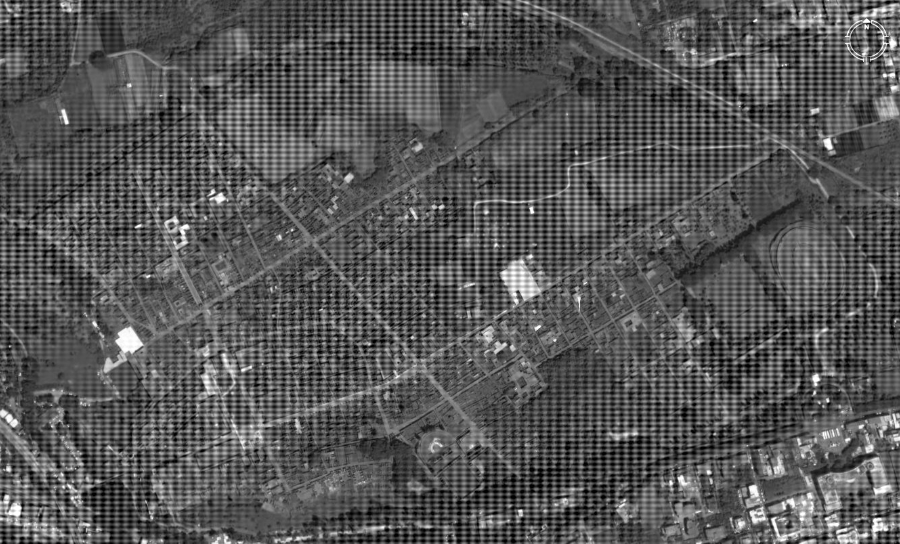

In [6]:
# loading and displaying the sample image
image = cv2.imread('q2.png', cv2.IMREAD_GRAYSCALE)
print("Original Image")
cv2_imshow(image)

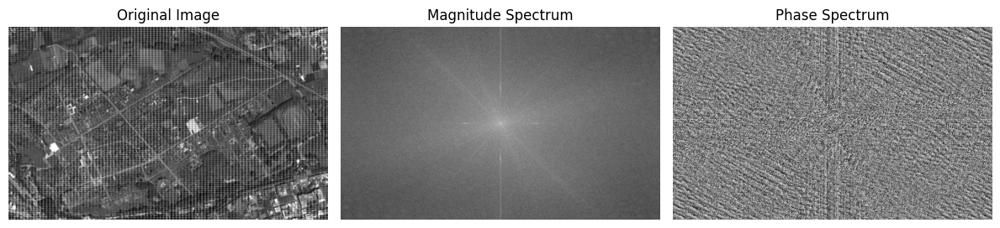

In [7]:
f_transform_1 = np.fft.fft2(image)
f_shift_1 = np.fft.fftshift(f_transform_1)
magnitude_spectrum_1 = 20 * np.log(np.abs(f_shift_1) + 1)
phase_spectrum_1 = np.angle(f_shift_1)

images = [image, magnitude_spectrum_1, phase_spectrum_1]
descriptions = ["Original Image", "Magnitude Spectrum", "Phase Spectrum", "", "", "", "", "", ""]

fig, axes = plt.subplots(1, 3, figsize=(12, 10))

for i, ax in enumerate(axes.flatten()):
    if i < len(images):
     ax.imshow(images[i], cmap='gray')
     ax.set_title(descriptions[i])
     ax.axis('off')  # Hide axes

plt.tight_layout()
plt.show()

In [8]:
# Computing the 2D Fourier Transform of an image
def compute_fft(image):
    return np.fft.fftshift(np.fft.fft2(image))

# Computing the inverse 2D Fourier Transform of an image
def compute_ifft(fft_image):
    return np.fft.ifft2(np.fft.ifftshift(fft_image))

# Crreating a Butterworth Band Reject Filter in terms of radial distance
def butterworth_bandreject_filter(shape, low_sigma, high_sigma, order=1):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2  # defining the center of the image

    # Creating a mesh grid for the frequency coordinates
    x = np.arange(-ccol, ccol)
    y = np.arange(-crow, crow)
    x, y = np.meshgrid(x, y)

    # Calculating the radial distance from the center (frequency coordinates)
    distance_squared = x**2 + y**2
    distance = np.sqrt(distance_squared)

    # Butterworth filter formula: creating a ring by rejecting frequencies in the band
    H = 1 / (1 + (distance / low_sigma)**(2 * order))  # Keeping low frequencies unchanged
    H += 1 / (1 + (distance / high_sigma)**(2 * order))  # Keeping high frequencies unchanged

    # Zero out the frequencies in the ring (between low_sigma and high_sigma)
    mask = np.logical_and(distance >= low_sigma, distance <= high_sigma)
    H[mask] = 0  # Setting to zero in the ring

    return H

# Applying the filter in the frequency domain
def apply_filter(fft_image, filter_mask):
    return fft_image * filter_mask

# Processing the image
def process_image(image_path, low_sigma, high_sigma, order=1):
    fft_image = compute_fft(image)
    filter_mask = butterworth_bandreject_filter(image.shape, low_sigma, high_sigma, order)
    filtered_fft_image = apply_filter(fft_image, filter_mask)
    filtered_image = np.abs(compute_ifft(filtered_fft_image))

    return filtered_image

low_sigma = 95   # Inner radius of the band (cutoff for high frequencies)
high_sigma = 110  # Outer radius of the band (cutoff for low frequencies)
order = 1        # Filter order

#Sigma's found by trial and error by looking to the magnitude spectrum until the ring is enough for covering

filtered_image = process_image(image, low_sigma, high_sigma, order)


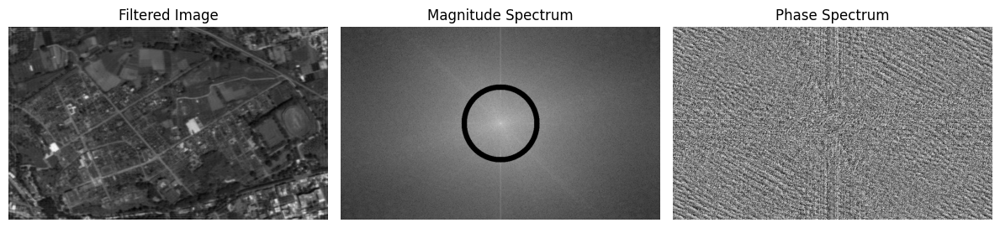

In [9]:
#Applying fourier transform to the filtered image to show the ring created in the Butterworth Band Reject
f_transform_1 = np.fft.fft2(filtered_image)
f_shift_1 = np.fft.fftshift(f_transform_1)
magnitude_spectrum_1 = 20 * np.log(np.abs(f_shift_1) + 1)
phase_spectrum_1 = np.angle(f_shift_1)

images = [filtered_image, magnitude_spectrum_1, phase_spectrum_1]
descriptions = ["Filtered Image", "Magnitude Spectrum", "Phase Spectrum", "", "", "", "", "", ""]

fig, axes = plt.subplots(1, 3, figsize=(12, 10))

for i, ax in enumerate(axes.flatten()):
    if i < len(images):
     ax.imshow(images[i], cmap='gray')
     ax.set_title(descriptions[i])
     ax.axis('off')  # Hide axes

plt.tight_layout()
plt.show()

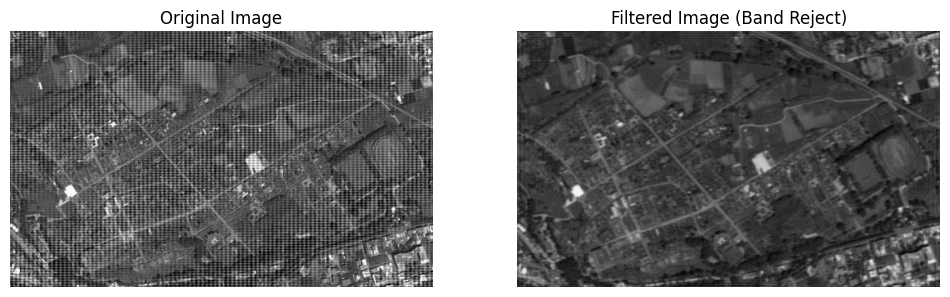

In [10]:
original_image = image

plt.figure(figsize=(12, 6))

# Plotting the original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(original_image, cmap='gray')
plt.axis('off')

# Plot the filtered image
plt.subplot(1, 2, 2)
plt.title('Filtered Image (Band Reject)')
plt.imshow(filtered_image, cmap='gray')
plt.axis('off')

plt.show()


**Question 3**: Using Granulometry to Distinguish Rock Types


In [11]:
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=10wWcbQLHyWJpY5z8sKpqwaRUPx2iW-We" -O labeled-1.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=173nRU_sE8wsty4OpRmyxfJLPnwKDagmR" -O labeled-2.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=15hG7e4MjwaLnUs0rlnBo9-JQBdZ9KQF8" -O labeled-3.jpg

!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1fBIe3hbZnwG3fakvFgn3DTeZbg8ekrw6" -O unlabeled-A.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=16YncfutjgtwtPMlWM2XGkCQ5uRxzYKfh" -O unlabeled-B.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1kyC6nZUylBOSgyoucgX9n3ze-9Qp1QKU" -O unlabeled-C.jpg


--2024-11-26 13:18:06--  https://drive.google.com/uc?export=download&id=10wWcbQLHyWJpY5z8sKpqwaRUPx2iW-We
Resolving drive.google.com (drive.google.com)... 74.125.139.102, 74.125.139.138, 74.125.139.139, ...
Connecting to drive.google.com (drive.google.com)|74.125.139.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=10wWcbQLHyWJpY5z8sKpqwaRUPx2iW-We&export=download [following]
--2024-11-26 13:18:06--  https://drive.usercontent.google.com/download?id=10wWcbQLHyWJpY5z8sKpqwaRUPx2iW-We&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 173.194.212.132, 2607:f8b0:400c:c11::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|173.194.212.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 202310 (198K) [image/jpeg]
Saving to: ‘labeled-1.jpg’

labeled-1.jpg       100%[===================>] 197.57K  --.-KB/s    in 0.002s 

The unlabeled image A is closest to labeled image 1 with a minimum distance of 0.44


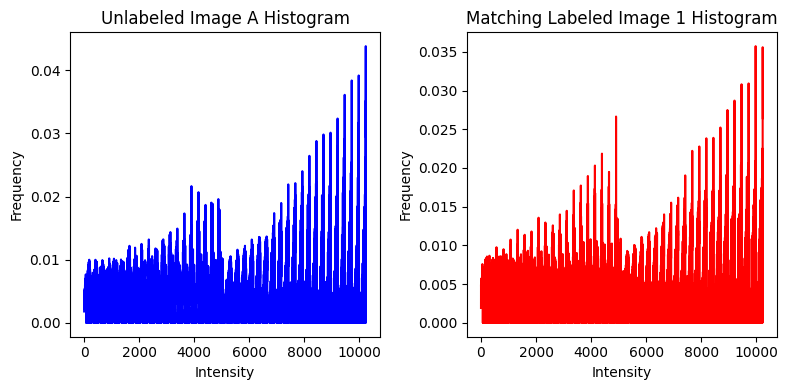



The unlabeled image B is closest to labeled image 2 with a minimum distance of 0.73


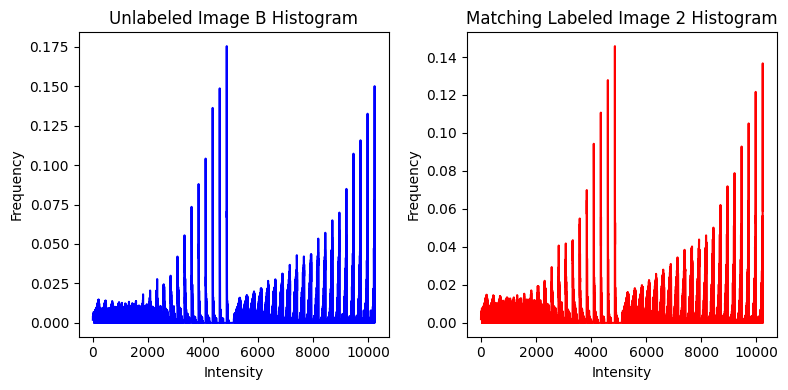



The unlabeled image C is closest to labeled image 3 with a minimum distance of 0.41


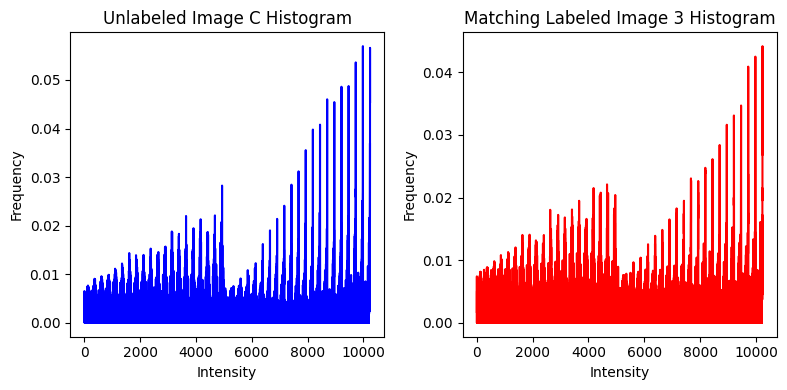

In [12]:
# Computing granulometric histograms using opening and closing operations
def compute_granulometric_histograms(image, max_radius):
    opening_hist = []
    closing_hist = []

    # Getting the total number of pixels in the image
    total_pixels = image.size

    for radius in range(1, max_radius + 1):
        # Creating a circular structuring element using OpenCV
        struct_elem = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * radius + 1, 2 * radius + 1))

        # Performing the opening operation
        opened_image = cv2.morphologyEx(image, cv2.MORPH_OPEN, struct_elem)
        opened_hist = cv2.calcHist([opened_image], [0], None, [256], [0, 256])
        opened_hist = opened_hist.flatten() / total_pixels  # Normalize by total pixels
        opening_hist.append(opened_hist)

        # Performing the closing operation
        closed_image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, struct_elem)
        closed_hist = cv2.calcHist([closed_image], [0], None, [256], [0, 256])
        closed_hist = closed_hist.flatten() / total_pixels  # Normalize by total pixels
        closing_hist.append(closed_hist)

    combined_hist = np.concatenate([np.array(opening_hist).flatten(), np.array(closing_hist).flatten()])
    return combined_hist

# Calculating Euclidean distance between two histograms
def euclidean_distance(hist1, hist2):
    return np.sqrt(np.sum((hist1 - hist2) ** 2))

# Plotting histograms
def plot_histograms(image_name, labeled_name, unlabeled_hist, labeled_hist):
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.plot(unlabeled_hist, color='blue')
    plt.title(f"Unlabeled Image {image_name} Histogram")
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")

    plt.subplot(1, 2, 2)
    plt.plot(labeled_hist, color='red')
    plt.title(f"Matching Labeled Image {labeled_name} Histogram")
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()

# Applying histogram equalization to an image to handle different brightnesses
def equalize_image(image):
    return cv2.equalizeHist(image)

# Loading labeled images
labeled_image1 = cv2.imread('labeled-1.jpg', cv2.IMREAD_GRAYSCALE)
labeled_image2 = cv2.imread('labeled-2.jpg', cv2.IMREAD_GRAYSCALE)
labeled_image3 = cv2.imread('labeled-3.jpg', cv2.IMREAD_GRAYSCALE)

# Applying histogram equalization to labeled images
labeled_image1 = equalize_image(labeled_image1)
labeled_image2 = equalize_image(labeled_image2)
labeled_image3 = equalize_image(labeled_image3)

# Computing granulometric histograms for labeled images
max_radius = 20
hist1 = compute_granulometric_histograms(labeled_image1, max_radius)
hist2 = compute_granulometric_histograms(labeled_image2, max_radius)
hist3 = compute_granulometric_histograms(labeled_image3, max_radius)

# Loading unlabeled images
unlabeled_image_A = cv2.imread('unlabeled-A.jpg', cv2.IMREAD_GRAYSCALE)
unlabeled_image_B = cv2.imread('unlabeled-B.jpg', cv2.IMREAD_GRAYSCALE)
unlabeled_image_C = cv2.imread('unlabeled-C.jpg', cv2.IMREAD_GRAYSCALE)

# Applying histogram equalization to unlabeled images
unlabeled_image_A = equalize_image(unlabeled_image_A)
unlabeled_image_B = equalize_image(unlabeled_image_B)
unlabeled_image_C = equalize_image(unlabeled_image_C)

# Comparing each unlabeled image to the labeled images
unlabeled_images = {
    "A": unlabeled_image_A,
    "B": unlabeled_image_B,
    "C": unlabeled_image_C,
}

labeled_histograms = [hist1, hist2, hist3]
labeled_names = ["1", "2", "3"]

# Loading labeled images
labeled_images = [
    cv2.imread('labeled-1.jpg', cv2.IMREAD_GRAYSCALE),
    cv2.imread('labeled-2.jpg', cv2.IMREAD_GRAYSCALE),
    cv2.imread('labeled-3.jpg', cv2.IMREAD_GRAYSCALE),
]

# Dictionary to store the matched images
matched_images = {}

# Processing each unlabeled image and plot histograms
for name, img in unlabeled_images.items():
    unlabeled_hist = compute_granulometric_histograms(img, max_radius)
    distances = [euclidean_distance(unlabeled_hist, labeled_hist) for labeled_hist in labeled_histograms]
    closest_match_index = distances.index(min(distances))
    closest_match = labeled_names[closest_match_index]
    min_distance = distances[closest_match_index]  # Minimum distance

    # Storing the matched image information in the dictionary
    matched_images[name] = {
        closest_match,
    }

    # Printing the closest match and the minimum distance
    print(f"The unlabeled image {name} is closest to labeled image {closest_match} with a minimum distance of {min_distance:.2f}")

    # Plotting the histograms of the matched images
    plot_histograms(name, closest_match, unlabeled_hist, labeled_histograms[closest_match_index])

    print("\n")



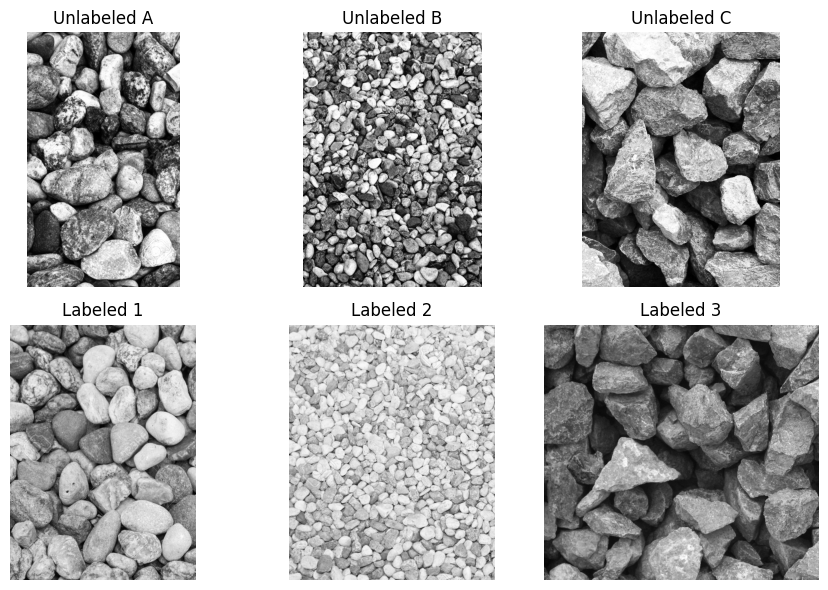

Matching Results: {'A': {'1'}, 'B': {'2'}, 'C': {'3'}}


In [13]:
def plot_matched_images(unlabeled_images, labeled_images, matched_images, labeled_names):
    # Determining the number of images to display
    num_images = len(unlabeled_images)
    columns = 3  # Number of images per row
    rows = 2     # Two rows: one for unlabeled, one for labeled

    # Creating a figure with enough subplots
    plt.figure(figsize=(columns * 3, rows * 3))  # Adjust figure size for clarity

    for i, (name, img) in enumerate(unlabeled_images.items()):
        # Retrieving the matched labeled image name and its index
        closest_match = list(matched_images[name])[0]
        closest_match_index = labeled_names.index(closest_match)
        labeled_img = labeled_images[closest_match_index]

        # Plotting the unlabeled image (top row)
        plt.subplot(rows, columns, i + 1)  # Top row: first image at index 1
        plt.imshow(img, cmap='gray')
        plt.title(f"Unlabeled {name}")
        plt.axis('off')  # Hide axis

        # Plotting the corresponding labeled image (bottom row)
        plt.subplot(rows, columns, i + 1 + columns)  # Bottom row
        plt.imshow(labeled_img, cmap='gray')
        plt.title(f"Labeled {closest_match}")
        plt.axis('off')  # Hide axis

    plt.tight_layout()
    plt.show()

# Calling the function to plot matched images
plot_matched_images(unlabeled_images, labeled_images, matched_images, labeled_names)
print("Matching Results:", matched_images)



**Question 4**: Median Filtering

In [14]:
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1SBvMh48cxyFAbFDuoIZHqtdh2sZlde6d" -O test_image_1.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=14miyPgPpyOnBbG_k7cUKDuSVCJFvo813" -O test_image_2.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1dFQ6QiUytmjbhf9SswMdwLn7TnmTH5Yg" -O test_image_3.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1o5K-O8DppX2GDBYWEc-gOQDz2SXP-DCs" -O test_image_4.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1tqbwb_ksQpOmO07sfBDE3OoUhRZ-QEw-" -O test_image_5.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1L0NzknvCXkpVwSzsLb6pXoGGJJsec2Pc" -O test_image_6.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=15ArXayU2kQYORzi0I1C1EGC7GWtSdyMG" -O test_image_7.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1cEyeI5QXtkIqq5Vp_-6ww3aLHlGKwzvF" -O test_image_8.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=1FEsCTvUms026KULbM0scw3aDPyhtJS2a" -O test_image_9.jpg
!wget --no-check-certificate "https://drive.google.com/uc?export=download&id=12RPMP-QkaHEoS_vfd_R89tDOCHZGmrvm" -O test_image_10.jpg


--2024-11-26 13:18:27--  https://drive.google.com/uc?export=download&id=1SBvMh48cxyFAbFDuoIZHqtdh2sZlde6d
Resolving drive.google.com (drive.google.com)... 74.125.139.102, 74.125.139.138, 74.125.139.139, ...
Connecting to drive.google.com (drive.google.com)|74.125.139.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1SBvMh48cxyFAbFDuoIZHqtdh2sZlde6d&export=download [following]
--2024-11-26 13:18:27--  https://drive.usercontent.google.com/download?id=1SBvMh48cxyFAbFDuoIZHqtdh2sZlde6d&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 173.194.212.132, 2607:f8b0:400c:c11::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|173.194.212.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53546 (52K) [image/jpeg]
Saving to: ‘test_image_1.jpg’

test_image_1.jpg    100%[===================>]  52.29K  --.-KB/s    in 0.001s

In [15]:
def is_24bit_rgb(image_path):
    # Reading the image
    image = cv2.imread(image_path)

    # Checking if the image is successfully loaded
    if image is None:
        print(f"Error: {image_path} could not be loaded.")
        return False

    # Checking the number of channels in the image
    if len(image.shape) == 3:  # Color image (RGB/BGR)
        height, width, channels = image.shape
        # A 24-bit RGB image should have 3 channels (RGB) and 8 bits per channel
        if channels == 3:
            return True
    return False

def check_images():
    # List of image filenames to check
    image_filenames = [f'test_image_{i}.jpg' for i in range(1, 11)]

    for image_filename in image_filenames:
        if is_24bit_rgb(image_filename):
            print(f"{image_filename} is a 24-bit RGB image.")
        else:
            print(f"{image_filename} is not a 24-bit RGB image.")

# Example usage
check_images()


test_image_1.jpg is a 24-bit RGB image.
test_image_2.jpg is a 24-bit RGB image.
test_image_3.jpg is a 24-bit RGB image.
test_image_4.jpg is a 24-bit RGB image.
test_image_5.jpg is a 24-bit RGB image.
test_image_6.jpg is a 24-bit RGB image.
test_image_7.jpg is a 24-bit RGB image.
test_image_8.jpg is a 24-bit RGB image.
test_image_9.jpg is a 24-bit RGB image.
test_image_10.jpg is a 24-bit RGB image.


In [16]:
# Function to add salt-and-pepper noise to an RGB image
def add_salt_and_pepper_noise_rgb(image, salt_prob, pepper_prob):
    noisy_image = image.copy()
    total_pixels = image.shape[0] * image.shape[1]

    # Adding salt noise (white pixels)
    num_salt = int(salt_prob * total_pixels)
    for channel in range(3):
        salt_coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape[:2]]
        noisy_image[salt_coords[0], salt_coords[1], channel] = 255

    # Adding pepper noise (black pixels)
    num_pepper = int(pepper_prob * total_pixels)
    for channel in range(3):
        pepper_coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape[:2]]
        noisy_image[pepper_coords[0], pepper_coords[1], channel] = 0

    return noisy_image

# List of image filenames
image_filenames = [f"test_image_{i}.jpg" for i in range(1, 11)]

# Initializing lists to store image names and their corresponding salt and pepper probabilities
image_data = []

noisy_images = []

original_images = []

# Processing each image with random noise levels
for image_path in image_filenames:
    # Load the image
    image = cv2.imread(image_path)
    # Converting BGR to RGB for correct color handling
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    original_images.append(image)

    if image is not None:
        # Randomly choosing noise levels for each image
        salt_prob = np.random.uniform(0.01, 0.1)  # Salt noise level between 1% and 10%
        pepper_prob = np.random.uniform(0.01, 0.1)  # Pepper noise level between 1% and 10%

        # Appling salt-and-pepper noise
        noisy_image = add_salt_and_pepper_noise_rgb(image, salt_prob, pepper_prob)
        noisy_images.append(noisy_image)

        # Overwriting the original image
        cv2.imwrite(image_path, cv2.cvtColor(noisy_image, cv2.COLOR_RGB2BGR))

        # Appending data to list
        image_data.append({
            'Image': image_path,
            'Salt Probability': f"{salt_prob:.2f}",
            'Pepper Probability': f"{pepper_prob:.2f}"
        })

# Converting the list of dictionaries into a DataFrame and display it
df = pd.DataFrame(image_data)

# Printing the table
print("\nSalt and Pepper Probabilities for Each Image:")
df



Salt and Pepper Probabilities for Each Image:


,Image,Salt Probability,Pepper Probability
0,test_image_1.jpg,0.02,0.09
1,test_image_2.jpg,0.09,0.04
2,test_image_3.jpg,0.08,0.04
3,test_image_4.jpg,0.03,0.04
4,test_image_5.jpg,0.04,0.08
5,test_image_6.jpg,0.06,0.05
6,test_image_7.jpg,0.06,0.10
7,test_image_8.jpg,0.09,0.09
8,test_image_9.jpg,0.09,0.09
9,test_image_10.jpg,0.06,0.08


In [17]:
# Function to plot all of the given images
def plot_images(images, title_prefix="Image", rows=2, cols=5, figsize=(20, 10), cmap=None):
    plt.figure(figsize=figsize)
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(image, cmap=cmap)
        plt.title(f"{title_prefix} {i + 1}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

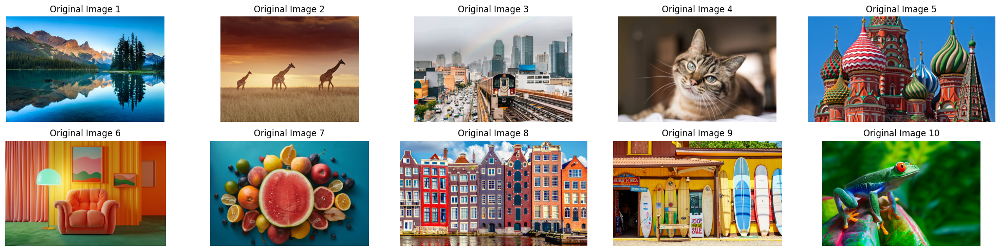

In [18]:
# Plotting the original images
plot_images(original_images, title_prefix="Original Image", rows=2, cols=5, figsize=(20, 5))

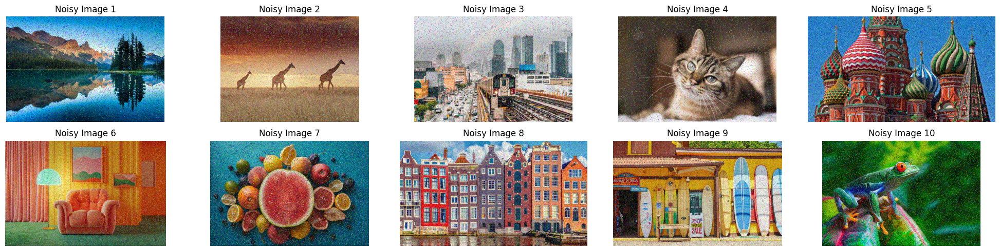

In [19]:
# Plotting the noisy images
plot_images(noisy_images, title_prefix="Noisy Image", rows=2, cols=5, figsize=(20, 5))

**Marginal Strategy**:

Median is calculated by sorting values along a single axis (either horizontally or vertically).

**Vector Strategy**:

1.   Lexicographical Ordering: Neighbors are sorted based on their coordinates in a dictionary order.

2.   L1 and L2 Norm-Based Ordering: Neighbors are sorted based on their distance to the central pixel, using either the Manhattan (L1) or Euclidean (L2) norm.




In [20]:
# Function to calculate Mean Squared Error (MSE)
def calculate_mse(image1, image2):
    # Calculating the squared difference
    mse = np.mean((image1 - image2) ** 2)
    return mse


In [21]:
def marginal_median_filter(image, window_size=3):
    rows, cols, channels = image.shape
    pad = window_size // 2
    padded_image = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), mode='reflect')
    filtered_image = np.zeros_like(image)

    for c in range(channels):
        for i in range(rows):
            for j in range(cols):
                window = padded_image[i:i + window_size, j:j + window_size, c]
                median_value = np.median(window)
                filtered_image[i, j, c] = median_value

    return filtered_image


Testing Marginal Strategy Filter


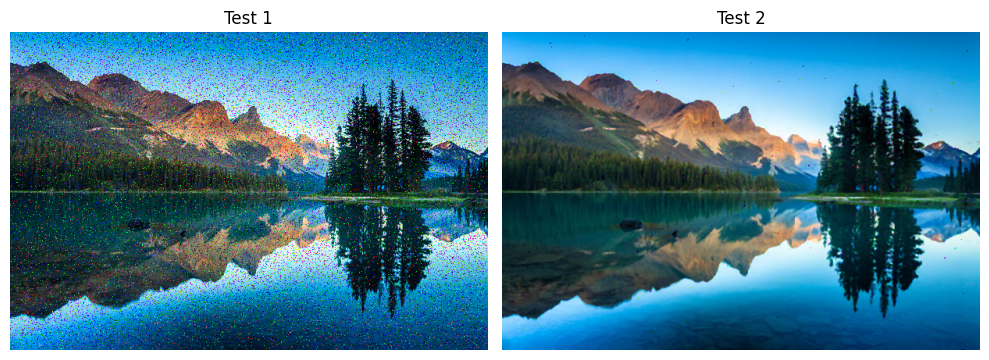

The MSE of original image and the filtered image: 23.108749572813874


In [22]:
print("Testing Marginal Strategy Filter")
single_filtered = marginal_median_filter(noisy_images[0], window_size=3)
plot_images([noisy_images[0], single_filtered], title_prefix="Test", rows=1, cols=2, figsize=(10, 5))

mse_value = calculate_mse(original_images[0], single_filtered)
print(f"The MSE of original image and the filtered image: {mse_value}")

Testing Marginal Strategy Filter with Window Size = 5


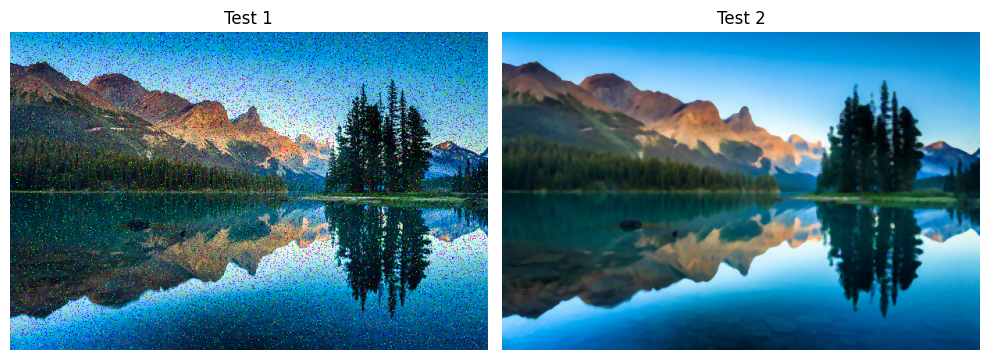

The MSE of original image and the filtered image: 30.589827897389892


In [37]:
print("Testing Marginal Strategy Filter with Window Size = 5")
single_filtered = marginal_median_filter(noisy_images[0], window_size=5)
plot_images([noisy_images[0], single_filtered], title_prefix="Test", rows=1, cols=2, figsize=(10, 5))

mse_value = calculate_mse(original_images[0], single_filtered)
print(f"The MSE of original image and the filtered image: {mse_value}")

In [23]:
filtered_images = [marginal_median_filter(img, window_size=3) for img in noisy_images]

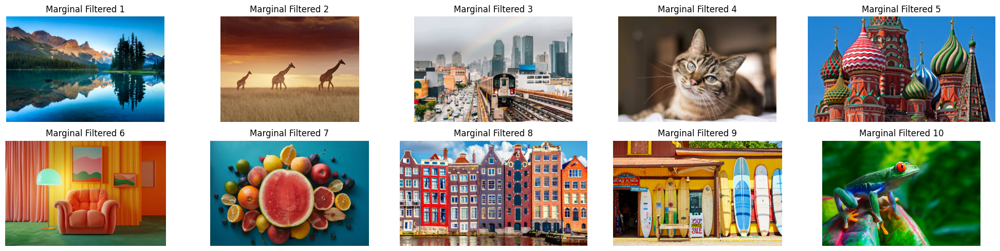

In [24]:
plot_images(filtered_images, title_prefix="Marginal Filtered", rows=2, cols=5, figsize=(20, 5))

In [25]:
def lexicographical_vector_strategy(image, window_size=3):
    # Ensuring the window size is odd
    if window_size % 2 == 0:
        raise ValueError("Window size must be an odd number.")

    # Getting the dimensions of the image
    height, width, channels = image.shape

    # Creating an output image
    filtered_image = np.zeros_like(image)

    # Defining the half size of the window
    half_w = window_size // 2

    # Padding the image with reflection mode
    padded_image = np.pad(image, ((half_w, half_w), (half_w, half_w), (0, 0)), mode='reflect')

    # Iterating over each pixel in the image
    for y in range(height):
        for x in range(width):
            # Extracting the local region (window_size x window_size) from the padded image
            local_region = padded_image[y:y + window_size, x:x + window_size]

            # Reshaping the local region to a 2D array of pixels
            reshaped_region = local_region.reshape(-1, channels)

            # Sorting the pixels lexicographically (sort by entire pixel tuple, not by channels separately)
            sorted_region = sorted(reshaped_region, key=lambda pixel: tuple(pixel))  # Sorting by pixel tuple

            # Taking the median pixel (middle pixel after sorting)
            median_pixel = sorted_region[len(sorted_region) // 2]

            # Assigning the median pixel to the output image
            filtered_image[y, x] = median_pixel

    return filtered_image


Testing Lexicographical Ordering, Vector Strategy Filter


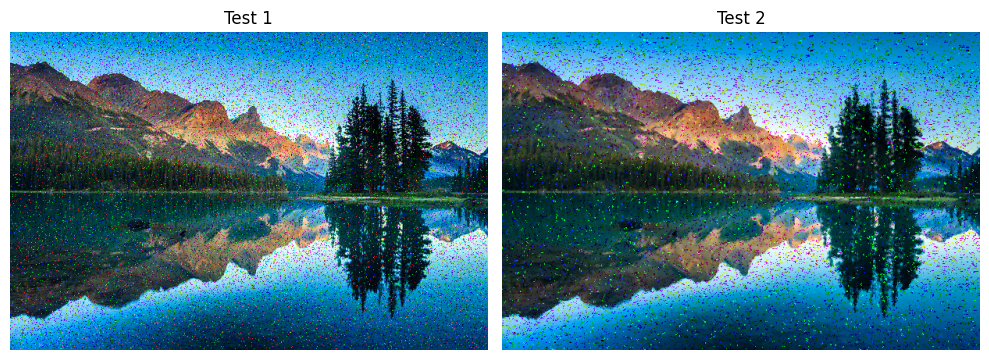

The MSE of original image and the filtered image: 30.51007758767995


In [26]:
print("Testing Lexicographical Ordering, Vector Strategy Filter")
single_filtered2 = lexicographical_vector_strategy(noisy_images[0], window_size=3)
plot_images([noisy_images[0], single_filtered2], title_prefix="Test", rows=1, cols=2, figsize=(10, 5))

mse_value = calculate_mse(original_images[0], single_filtered2)
print(f"The MSE of original image and the filtered image: {mse_value}")

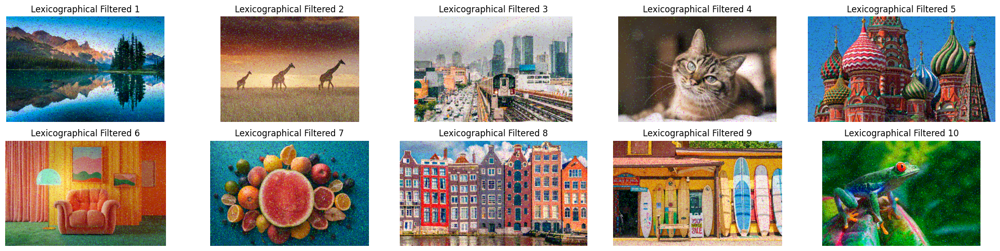

In [27]:
filtered_images2 = [lexicographical_vector_strategy(img, window_size=3) for img in noisy_images]

plot_images(filtered_images2, title_prefix="Lexicographical Filtered", rows=2, cols=5, figsize=(20, 5))

In [28]:
def l1_vector_strategy(image, window_size=3):
    if window_size % 2 == 0:
        raise ValueError("Window size must be an odd number.")

    height, width, channels = image.shape
    half_w = window_size // 2
    filtered_image = np.zeros_like(image)

    # Padding the image with reflection mode
    padded_image = np.pad(image, ((half_w, half_w), (half_w, half_w), (0, 0)), mode='reflect')

    # Precomputing reshaped windows and L1 distance calculations
    for y in range(height):
        for x in range(width):
            # Extracting the local region from the padded image
            local_region = padded_image[y:y + window_size, x:x + window_size]
            reshaped_region = local_region.reshape(-1, channels)  # Flatten the window to a 2D array

            # Selecting the reference pixel (the center pixel in the window)
            reference_pixel = tuple(reshaped_region[(window_size * window_size) // 2])  # Convert to tuple

            # Calculating L1 distance from the reference pixel (Manhattan distance) for each pixel in the reshaped region
            l1_distances = np.sum(np.abs(reshaped_region - reference_pixel), axis=1)

            # Sorting the pixels based on L1 distances
            sorted_region = reshaped_region[np.argsort(l1_distances)]

            # Selecting the median pixel (middle pixel after sorting)
            median_pixel = sorted_region[len(sorted_region) // 2]

            # Assigning the median pixel to the filtered image
            filtered_image[y, x] = median_pixel

    return filtered_image


Testing L1 Norm Based Ordering, Vector Strategy Filter


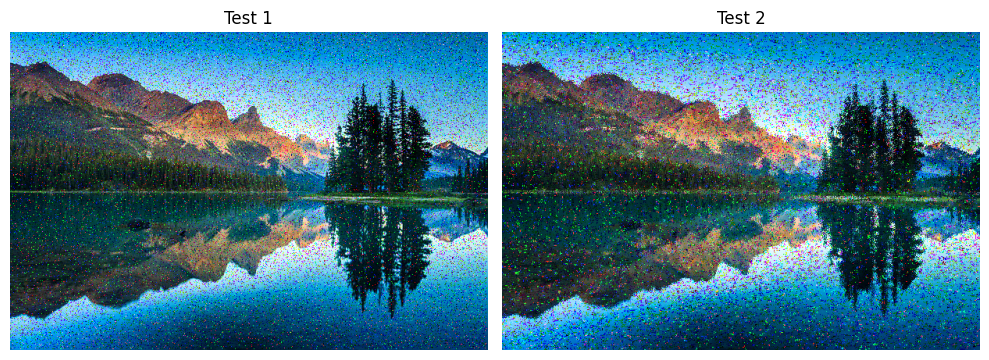

The MSE of original image and the filtered image: 50.15708701781366


In [29]:
print("Testing L1 Norm Based Ordering, Vector Strategy Filter")

single_filtered3 = l1_vector_strategy(noisy_images[0], window_size=3)
plot_images([noisy_images[0], single_filtered3], title_prefix="Test", rows=1, cols=2, figsize=(10, 5))

mse_value = calculate_mse(original_images[0], single_filtered3)
print(f"The MSE of original image and the filtered image: {mse_value}")

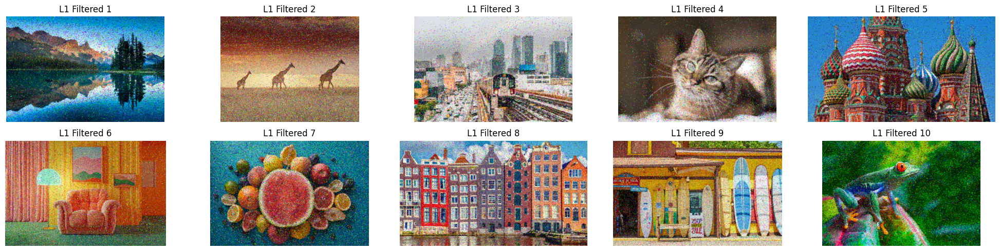

In [30]:
filtered_images3 = [l1_vector_strategy(img, window_size=3) for img in noisy_images]

plot_images(filtered_images3, title_prefix="L1 Filtered", rows=2, cols=5, figsize=(20, 5))

In [31]:
def l2_vector_strategy(image, window_size=3):
    if window_size % 2 == 0:
        raise ValueError("Window size must be an odd number.")

    height, width, channels = image.shape
    half_w = window_size // 2
    filtered_image = np.zeros_like(image)

    # Padding the image with reflection mode
    padded_image = np.pad(image, ((half_w, half_w), (half_w, half_w), (0, 0)), mode='reflect')

    # Iterating over each pixel in the image
    for y in range(height):
        for x in range(width):
            # Extracting the local region (window_size x window_size) from the padded image
            local_region = padded_image[y:y + window_size, x:x + window_size]
            reshaped_region = local_region.reshape(-1, channels)

            # Selecting the reference pixel (the first pixel in the reshaped region)
            reference_pixel = tuple(reshaped_region[0])  # Convert to tuple

            # Calculating L2 distances from the reference pixel (using tuple-based calculations)
            l2_distances = np.sqrt(np.sum((reshaped_region - reference_pixel) ** 2, axis=1))

            # Sorting the pixels based on L2 distances
            sorted_region = reshaped_region[np.argsort(l2_distances)]

            # Selecting the median pixel (middle pixel after sorting)
            median_pixel = sorted_region[len(sorted_region) // 2]

            # Assigning the median pixel to the filtered image
            filtered_image[y, x] = np.clip(median_pixel, 0, 255)  # Ensure pixel values are valid

    return filtered_image


Testing L2 Norm Based Ordering, Vector Strategy Filter


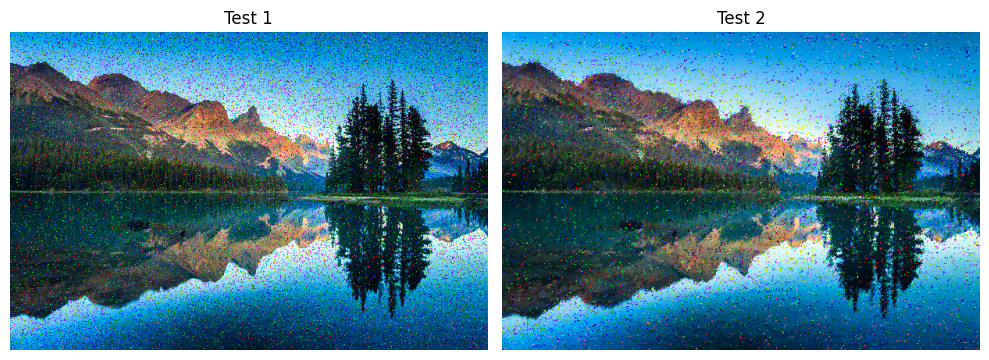

The MSE of original image and the filtered image: 33.72909591396471


In [32]:
print("Testing L2 Norm Based Ordering, Vector Strategy Filter")

single_filtered4 = l2_vector_strategy(noisy_images[0], window_size=3)
plot_images([noisy_images[0], single_filtered4], title_prefix="Test", rows=1, cols=2, figsize=(10, 5))

mse_value = calculate_mse(original_images[0], single_filtered4)
print(f"The MSE of original image and the filtered image: {mse_value}")

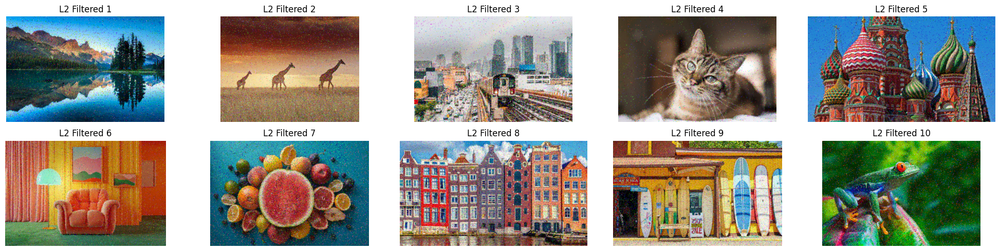

In [33]:
filtered_images4 = [l2_vector_strategy(img, window_size=3) for img in noisy_images]

plot_images(filtered_images4, title_prefix="L2 Filtered", rows=2, cols=5, figsize=(20, 5))

In [34]:
mse_data = []
for i in range(len(original_images)):
    mse_marginal = calculate_mse(original_images[i], filtered_images[i])
    mse_lexicographical = calculate_mse(original_images[i], filtered_images2[i])
    mse_l1 = calculate_mse(original_images[i], filtered_images3[i])
    mse_l2 = calculate_mse(original_images[i], filtered_images4[i])

    mse_data.append({
        'Image': f'test_image_{i + 1}.jpg',
        'Marginal MSE': mse_marginal,
        'Lexicographical MSE': mse_lexicographical,
        'L1 MSE': mse_l1,
        'L2 MSE': mse_l2
    })

df = pd.DataFrame(mse_data)
df

,Image,Marginal MSE,Lexicographical MSE,L1 MSE,L2 MSE
0,test_image_1.jpg,23.108750,30.510078,50.157087,33.729096
1,test_image_2.jpg,8.111906,15.737936,37.303348,19.716478
2,test_image_3.jpg,37.417007,42.941390,64.427888,48.235322
3,test_image_4.jpg,9.184535,13.261043,34.155837,19.320556
4,test_image_5.jpg,26.099458,35.356866,57.665675,44.170791
5,test_image_6.jpg,9.013890,18.187500,40.398256,20.691448
6,test_image_7.jpg,14.727924,26.195944,44.845920,29.836425
7,test_image_8.jpg,51.630434,59.347446,80.566988,64.791275
8,test_image_9.jpg,32.756994,41.434703,63.491477,47.035857
9,test_image_10.jpg,13.241818,20.791179,34.419884,23.572608


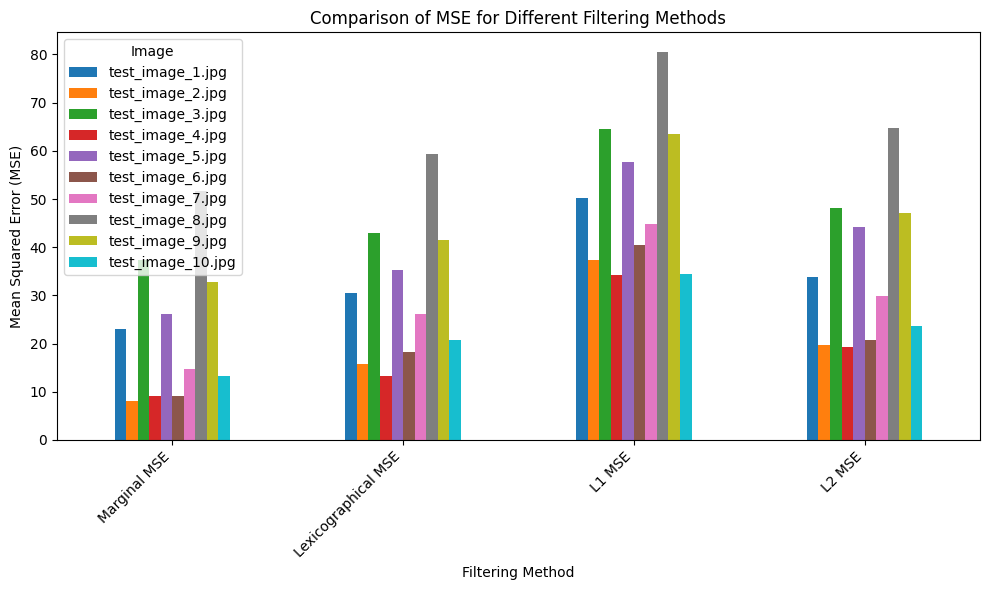

In [35]:
# Transposing the DataFrame for easier plotting
df_transposed = df.set_index('Image').T

# Creating the plot
df_transposed.plot(kind='bar', figsize=(10, 6))

# Customizing the plot
plt.title('Comparison of MSE for Different Filtering Methods')
plt.xlabel('Filtering Method')
plt.ylabel('Mean Squared Error (MSE)')
plt.xticks(rotation=45, ha='right')  # Rotating x-axis labels for better readability
plt.tight_layout()

plt.show()

In [36]:
import pandas as pd
from scipy.stats import pearsonr

salt_probs = [0.02, 0.09, 0.08, 0.03, 0.04, 0.06, 0.06, 0.09, 0.09, 0.06]
pepper_probs = [0.09, 0.04, 0.04, 0.04, 0.08, 0.05, 0.10, 0.09, 0.09, 0.08]
mse_marginal = [23.108750, 8.111906, 37.417007, 9.184535, 26.099458, 9.013890, 14.727924, 51.630434, 32.756994, 13.241818]
mse_lexicographical = [30.510078, 15.737936, 42.941390, 13.261043, 35.356866, 18.187500, 26.195944, 59.347446, 41.434703, 20.791179]
mse_l1 = [50.157087, 37.303348, 64.427888, 34.155837, 57.665675, 40.398256, 44.845920, 80.566988, 63.491477, 34.419884]
mse_l2 = [33.729096, 19.716478, 48.235322, 19.320556, 44.170791, 20.691448, 29.836425, 64.791275, 47.035857, 23.572608]

# Creating a DataFrame
data = pd.DataFrame({
    'Salt': salt_probs,
    'Pepper': pepper_probs,
    'Marginal MSE': mse_marginal,
    'Lexicographical MSE': mse_lexicographical,
    'L1 MSE': mse_l1,
    'L2 MSE': mse_l2
})

# Calculating correlations
salt_corr_marginal = pearsonr(data['Salt'], data['Marginal MSE'])[0]
pepper_corr_marginal = pearsonr(data['Pepper'], data['Marginal MSE'])[0]

salt_corr_lexicographical = pearsonr(data['Salt'], data['Lexicographical MSE'])[0]
pepper_corr_lexicographical = pearsonr(data['Pepper'], data['Lexicographical MSE'])[0]

salt_corr_l1 = pearsonr(data['Salt'], data['L1 MSE'])[0]
pepper_corr_l1 = pearsonr(data['Pepper'], data['L1 MSE'])[0]

salt_corr_l2 = pearsonr(data['Salt'], data['L2 MSE'])[0]
pepper_corr_l2 = pearsonr(data['Pepper'], data['L2 MSE'])[0]

print(f"Correlation between Salt and Marginal MSE: {salt_corr_marginal}")
print(f"Correlation between Pepper and Marginal MSE: {pepper_corr_marginal}")
print(f"Correlation between Salt and Lexicographical MSE: {salt_corr_lexicographical}")
print(f"Correlation between Pepper and Lexicographical MSE: {pepper_corr_lexicographical}")
print(f"Correlation between Salt and L1 MSE: {salt_corr_l1}")
print(f"Correlation between Pepper and L1 MSE: {pepper_corr_l1}")
print(f"Correlation between Salt and L2 MSE: {salt_corr_l2}")
print(f"Correlation between Pepper and L2 MSE: {pepper_corr_l2}")


Correlation between Salt and Marginal MSE: 0.4012259908386374
Correlation between Pepper and Marginal MSE: 0.3630519896375672
Correlation between Salt and Lexicographical MSE: 0.4213846610128144
Correlation between Pepper and Lexicographical MSE: 0.4519482573472859
Correlation between Salt and L1 MSE: 0.4273393701443463
Correlation between Pepper and L1 MSE: 0.37140858095872964
Correlation between Salt and L2 MSE: 0.3915613770401191
Correlation between Pepper and L2 MSE: 0.42757338419326907
